In [4]:
#Code Written by Diana Lewis
## Code edited and debugged by Matthew Miller
## Additional help from ChatGPT and Label Studio documentation
import numpy as np
import os
import cv2
import csv
import matplotlib.pyplot as plt
import math
from sklearn.model_selection import train_test_split
import tensorflow as tf 
from tensorflow.keras import layers, models 
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D, concatenate, Conv2DTranspose, ZeroPadding2D
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from torchvision import transforms as T
from sklearn.metrics import confusion_matrix
from tensorflow.keras.callbacks import ReduceLROnPlateau
from tensorflow.keras.optimizers import RMSprop
from tensorflow.keras import optimizers
from sklearn.metrics import accuracy_score, precision_score, recall_score
from keras import backend as K  


ModuleNotFoundError: No module named 'torchvision'

In [5]:
#Input Images from File to train the model 
# Specify the folder containing the images and CSV file
folder_path = 'Glaucoma_Balanced_Dataset/Preprocessed_images_input_to_bound'

# Load preprocessed images
images = []    #images should not be a list, it needs to be a 4D numpy array
for i in range(30):  # Assuming 30 images starting from 000000
    image_filename = f'enhanced_TRAIN{i:06d}.jpg'  # Zero-padded 6-digit number
    image_path = os.path.join(folder_path, image_filename)
    image = cv2.imread(image_path)
    images.append(image)
    
# Load bounding box labels from CSV file
bounding_box_labels = []
image_filenames = []  # List to store image filenames
csv_file = os.path.join(folder_path, 'Glaucoma30_bounding_boxes_06Apr2024.csv')
with open(csv_file, 'r') as csvfile:
    csvreader = csv.reader(csvfile)
    next(csvreader)  # Skip header row
    for row in csvreader:
        # Extract image filename from column 4 (assuming 0-based indexing)
        image_filename = row[3].strip()  # Remove leading/trailing whitespaces
        image_filenames.append(image_filename)  # Add filename to the list
        # Extract bounding box parameters from the "rect" column
        bbox_params = eval(row[5])  # Assuming "rect" is the 6th column
        # Extract individual bounding box parameters from the list of dictionaries
        bbox_dict = bbox_params[0]  # Assuming there's only one dictionary in the list
        x = int(bbox_dict['x'])
        y = int(bbox_dict['y'])
        width = int(bbox_dict['width'])
        height = int(bbox_dict['height'])

        ##### Adjust bounding box parameters (trial and error)
        #x_adjusted = x * 21  # Adjust x-coordinate by adding 10 pixels
        #y_adjusted = y * 10 # Adjust y-coordinate by adding 10 pixels
        #width_adjusted = width * 21  # Adjust width by scaling by a factor of 1.1
        #height_adjusted = height * 10  # Adjust height by scaling by a factor of 1.1
        ##### Add bounding box parameters to the list
        #bounding_box_labels.append([x, y, width, height])
        
        
        #Matt found the real way to deal the image image size mismatch
        #label studio just gives the percentages of the overall image size for the bounding box
        #Here's the non trial and error method:
        
        #These are needed to show what image size the boxes have to go back to
        original_width = 2048
        original_height = 1024
        
        x_adjusted = int(x / 100.0 * original_width)
        y_adjusted = int(y / 100.0 * original_height)
        width_adjusted = int(width / 100.0 * original_width)
        height_adjusted = int(height / 100.0 * original_height)
        
        bounding_box_labels.append([x_adjusted, y_adjusted, width_adjusted, height_adjusted])

        # Process bounding box parameters as needed
        # Example: Print adjusted bounding box parameters
        print(f"Image: {image_filename}, Adjusted Bounding Box: x={x_adjusted}, y={y_adjusted}, "
                  f"width={width_adjusted}, height={height_adjusted}")


# Save bounding box labels into a CSV file
csv_output_file = os.path.join(folder_path, 'bounding_box_labels_adjusted.csv')
with open(csv_output_file, 'w', newline='') as csvfile:
    csvwriter = csv.writer(csvfile)
    csvwriter.writerow(['Image', 'X', 'Y', 'Width', 'Height'])  # Write header row
    for filename, bbox in zip(image_filenames, bounding_box_labels):
        csvwriter.writerow([filename] + bbox)

# Convert bounding box labels to numpy array
labels = np.array(bounding_box_labels)

# Split dataset into training and validation sets
X_train, X_val, y_train, y_val = train_test_split(images, labels, test_size=0.2, random_state=42)

Image: enhanced_TRAIN000000.jpg, Adjusted Bounding Box: x=245, y=235, width=327, height=368
Image: enhanced_TRAIN000001.jpg, Adjusted Bounding Box: x=1433, y=194, width=327, height=337
Image: enhanced_TRAIN000002.jpg, Adjusted Bounding Box: x=512, y=440, width=225, height=235
Image: enhanced_TRAIN000003.jpg, Adjusted Bounding Box: x=430, y=235, width=307, height=358
Image: enhanced_TRAIN000004.jpg, Adjusted Bounding Box: x=1187, y=337, width=245, height=256
Image: enhanced_TRAIN000005.jpg, Adjusted Bounding Box: x=1249, y=378, width=266, height=286
Image: enhanced_TRAIN000006.jpg, Adjusted Bounding Box: x=1228, y=153, width=450, height=450
Image: enhanced_TRAIN000007.jpg, Adjusted Bounding Box: x=1331, y=184, width=348, height=368
Image: enhanced_TRAIN000008.jpg, Adjusted Bounding Box: x=1228, y=409, width=204, height=204
Image: enhanced_TRAIN000009.jpg, Adjusted Bounding Box: x=204, y=296, width=307, height=327
Image: enhanced_TRAIN000010.jpg, Adjusted Bounding Box: x=573, y=368, widt

In [6]:
# Print lengths of images and bounding_box_labels lists
print("Number of images:", len(images))
print("Number of bounding box labels:", len(bounding_box_labels))

# Print contents of bounding_box_labels list
#for idx, label in enumerate(bounding_box_labels):
    #print(f"Label {idx + 1}:", label)

print("Number of images in X_train:", len(X_train))
print("Number of labels in y_train:", len(y_train))

# Print a few samples from X_train and y_train
for i in range(min(30, len(X_train))):
    print("Image shape:", X_train[i].shape)
    print("Label:", y_train[i])

#DEBUGGING
#print("Image filenames:", image_filenames)
#print("Image filename from CSV:", image_filename)

# Convert lists to numpy arrays
X_train_np = np.array(X_train)
y_train_np = np.array(y_train)
X_val_np = np.array(X_val)
y_val_np = np.array(y_val)

print("Shape of X_train:", X_train_np.shape)
print("Shape of y_train:", y_train_np.shape)

# Check shapes
#print("Shape of X_train:", X_train.shape)
#print("Shape of y_train:", y_train.shape)
print("Shape of X_val:", X_val_np.shape)
print("Shape of y_val:", y_val_np.shape)

# Inspect a few samples
print("Sample image from X_train:", X_train[0].shape)
print("Sample bounding box from y_train:", y_train[0])
print("Sample image from X_val:", X_val[0].shape)
print("Sample bounding box from y_val:", y_val[0])

Number of images: 30
Number of bounding box labels: 30
Number of images in X_train: 24
Number of labels in y_train: 24
Image shape: (1024, 2048, 3)
Label: [593 368 225 245]
Image shape: (1024, 2048, 3)
Label: [1208  358  245  245]
Image shape: (1024, 2048, 3)
Label: [143 174 286 317]
Image shape: (1024, 2048, 3)
Label: [245 235 327 368]
Image shape: (1024, 2048, 3)
Label: [1187  337  245  256]
Image shape: (1024, 2048, 3)
Label: [1351  296  368  399]
Image shape: (1024, 2048, 3)
Label: [1249  378  266  286]
Image shape: (1024, 2048, 3)
Label: [593 430 204 245]
Image shape: (1024, 2048, 3)
Label: [1146  378  245  256]
Image shape: (1024, 2048, 3)
Label: [430 317 389 430]
Image shape: (1024, 2048, 3)
Label: [1433  194  327  337]
Image shape: (1024, 2048, 3)
Label: [512 440 225 235]
Image shape: (1024, 2048, 3)
Label: [225 317 266 307]
Image shape: (1024, 2048, 3)
Label: [430 235 307 358]
Image shape: (1024, 2048, 3)
Label: [593 430 225 235]
Image shape: (1024, 2048, 3)
Label: [1413  337 

In [7]:
# Load bounding box labels from CSV file
csv_file = os.path.join(folder_path, 'Glaucoma30_bounding_boxes_06Apr2024.csv')
with open(csv_file, 'r') as csvfile:
    csvreader = csv.reader(csvfile)
    next(csvreader)  # Skip header row
    for row in csvreader:
        # Extract image filename from the 4th column
        image_filename = row[3]  # Assuming image filename is in the 4th column
        print("Image filename from CSV:", image_filename)
        
        # Find the index of the image filename in the list of image filenames
        image_index = [i for i, filename in enumerate(image_filenames) if filename == image_filename]
        print("Index of image filename:", image_index)
        
        # Print the bounding box label corresponding to the image
        bounding_box_label = bounding_box_labels[image_index[0]]
        print("Bounding box label:", bounding_box_label)

Image filename from CSV: enhanced_TRAIN000000.jpg
Index of image filename: [0]
Bounding box label: [245, 235, 327, 368]
Image filename from CSV: enhanced_TRAIN000001.jpg
Index of image filename: [1]
Bounding box label: [1433, 194, 327, 337]
Image filename from CSV: enhanced_TRAIN000002.jpg
Index of image filename: [2]
Bounding box label: [512, 440, 225, 235]
Image filename from CSV: enhanced_TRAIN000003.jpg
Index of image filename: [3]
Bounding box label: [430, 235, 307, 358]
Image filename from CSV: enhanced_TRAIN000004.jpg
Index of image filename: [4]
Bounding box label: [1187, 337, 245, 256]
Image filename from CSV: enhanced_TRAIN000005.jpg
Index of image filename: [5]
Bounding box label: [1249, 378, 266, 286]
Image filename from CSV: enhanced_TRAIN000006.jpg
Index of image filename: [6]
Bounding box label: [1228, 153, 450, 450]
Image filename from CSV: enhanced_TRAIN000007.jpg
Index of image filename: [7]
Bounding box label: [1331, 184, 348, 368]
Image filename from CSV: enhanced_T

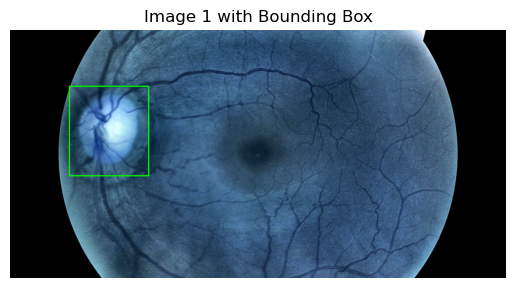

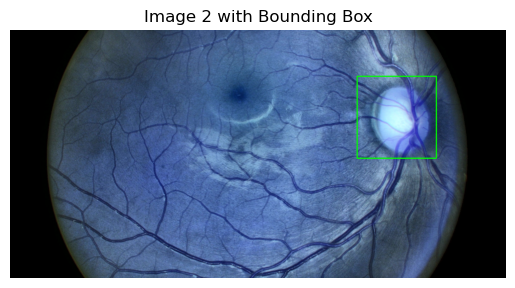

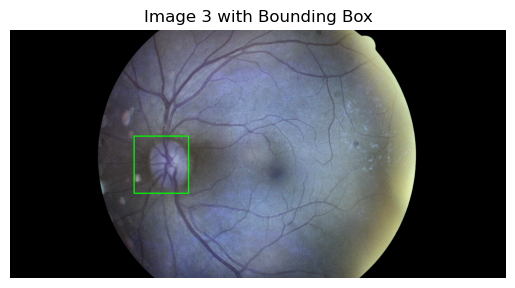

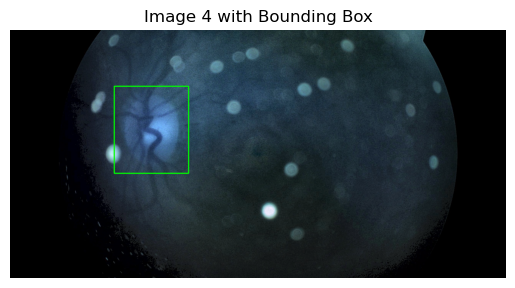

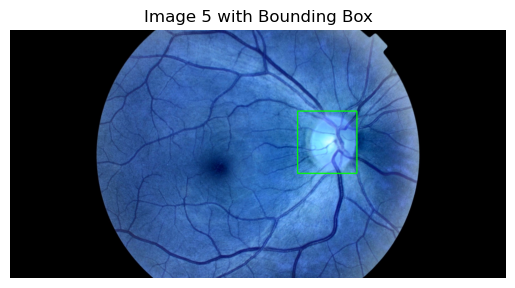

...

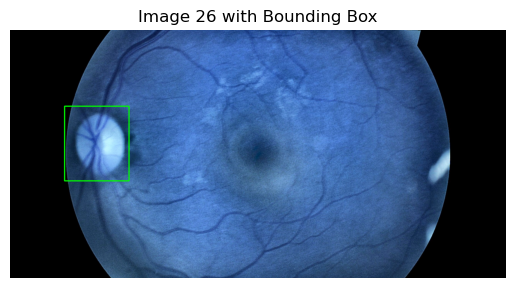

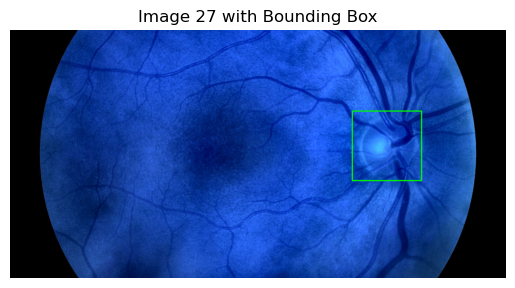

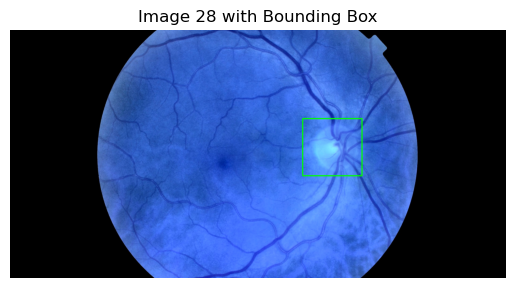

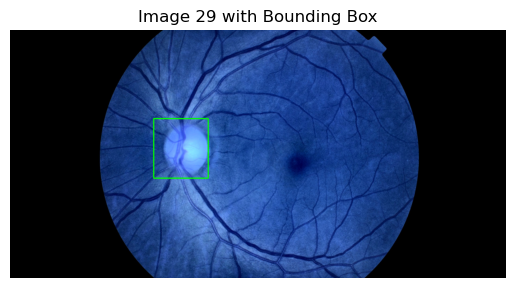

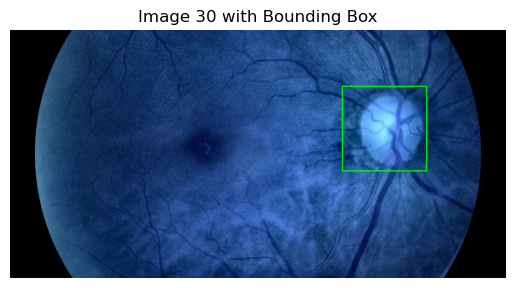

In [8]:
# Function to draw bounding boxes on images
def draw_bounding_box(image, bbox):
    x_adjusted, y_adjusted, width_adjusted, height_adjusted = bbox
    # Draw bounding box rectangle on image
    #cv2.rectangle(image, (x, y), (x + w, y + h), (0, 255, 0), 2)
    cv2.rectangle(image, (x_adjusted, y_adjusted), (x_adjusted + width_adjusted, y_adjusted + height_adjusted), (0, 255, 0), 4)
    return image

# Visualize images with bounding boxes
for i in range(len(labels)):
    image = images[i].copy()  # Make a copy of the image to avoid modifying the original
    bbox = labels[i]  # Get the bounding box for the current image
    # Draw bounding box on image
    image_with_bbox = draw_bounding_box(image, bbox)
    # Display image with bounding box
    plt.imshow(image_with_bbox)
    plt.title(f"Image {i+1} with Bounding Box")
    plt.axis('off')
    plt.show()

    
    
## Matt: FYI these images are showing as blueish instead of redish since you have to display it as BRG instead of RGB.
## Look at some of my other code if you're interested in seeing how you display it correctly
## Leaving it as blue has no impact on the later steps, it's just a matter of how it displays


##use half the width to make a radius and make a circular mask

In [9]:
def create_binary_mask(image_shape, bbox):
    mask = np.zeros(image_shape, dtype=np.uint8)
    x, y, width, height = bbox
    mask[y:y+height, x:x+width] = 1
    return mask

def convert_bboxes_to_masks(images, bboxes):
    masks = []
    for image, bbox in zip(images, bboxes):
        mask = create_binary_mask(image.shape[:2], bbox)
        masks.append(mask)
    return masks

# Example usage:
# Assuming X_train contains input images and y_train contains bounding box labels
masks_train = convert_bboxes_to_masks(X_train, y_train)
masks_val = convert_bboxes_to_masks(X_val, y_val)

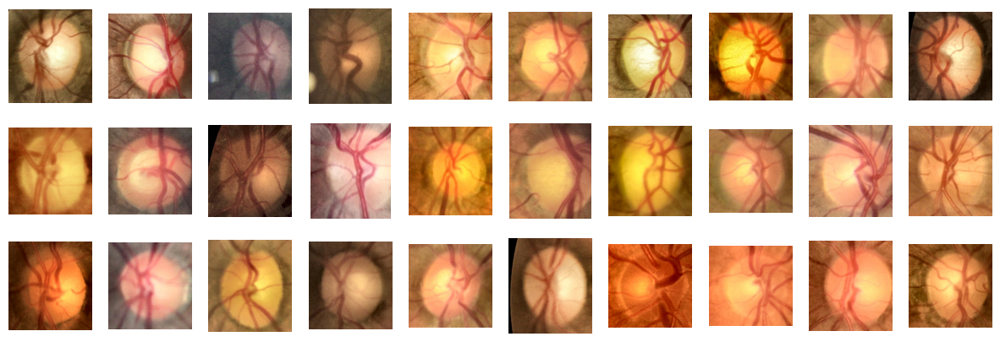

In [10]:
#Crop out bounding box 
#will get moved to after network for automated bounding box but for now trying something

# Function to crop images based on bounding box coordinates
def crop_outside_bounding_box(images, bounding_boxes):
    cropped_images = []
    for image, bbox in zip(images, bounding_boxes):
        x, y, width, height = bbox
        # Crop the bounding box region
        roi = image[y:y+height, x:x+width]
        # Create a mask for the bounding box region
        mask = np.zeros_like(roi)
        mask[:, :] = 255
        # Remove the black background
        masked_image = cv2.bitwise_and(roi, mask)
        cropped_images.append(masked_image)
    return cropped_images

# Crop the images
cropped_images = crop_outside_bounding_box(images, bounding_box_labels)

# Visualize the cropped images
plt.figure(figsize=(15, 5))
for i, cropped_image in enumerate(cropped_images):
    plt.subplot(3, 10, i+1)
    plt.imshow(cv2.cvtColor(cropped_image, cv2.COLOR_BGR2RGB))
    plt.axis('off')
plt.show()


Cropped Image Sizes: [(368, 327, 3), (337, 327, 3), (235, 225, 3), (358, 307, 3), (256, 245, 3), (286, 266, 3), (450, 450, 3), (368, 348, 3), (204, 204, 3), (327, 307, 3), (215, 204, 3), (256, 245, 3), (317, 286, 3), (245, 204, 3), (307, 286, 3), (215, 184, 3), (399, 368, 3), (245, 245, 3), (225, 204, 3), (358, 327, 3), (348, 327, 3), (235, 225, 3), (430, 389, 3), (368, 348, 3), (245, 245, 3), (307, 266, 3), (286, 286, 3), (235, 245, 3), (245, 225, 3), (348, 348, 3)]


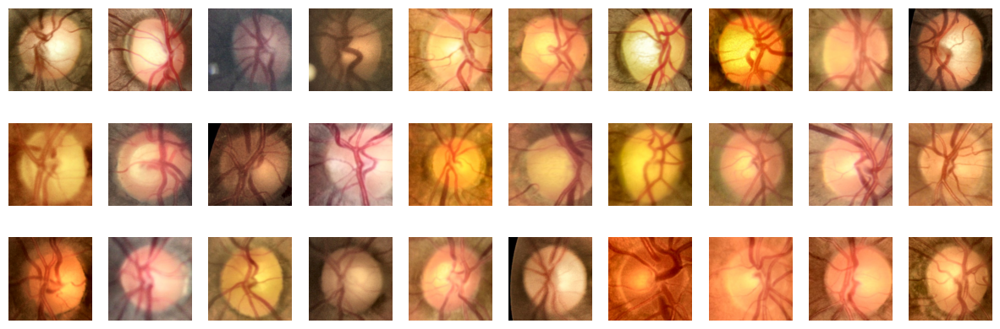

In [11]:
# Resize images to all be the same dimensions
cropped_image_sizes = [cropped_image.shape for cropped_image in cropped_images]
print("Cropped Image Sizes:", cropped_image_sizes)

def resize_images(images, size):
    resized_images = [cv2.resize(image, size) for image in images]
    return resized_images

# Define the desired size
desired_size = (256, 256) 

# Resize the cropped images
resized_images = resize_images(cropped_images, desired_size)

# Determine the size of the resized images
resized_image_sizes = [image.shape for image in resized_images]
#print("Resized Image Sizes:", resized_image_sizes)

# Visualize the resized images
plt.figure(figsize=(15, 5))
for i, resized_image in enumerate(resized_images):
    plt.subplot(3, 10, i+1)
    plt.imshow(cv2.cvtColor(resized_image, cv2.COLOR_BGR2RGB))
    plt.axis('off')
plt.show()

In [16]:
type(resized_images)

list

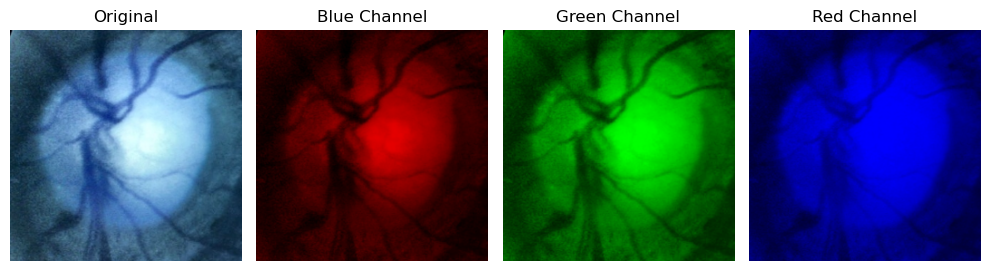

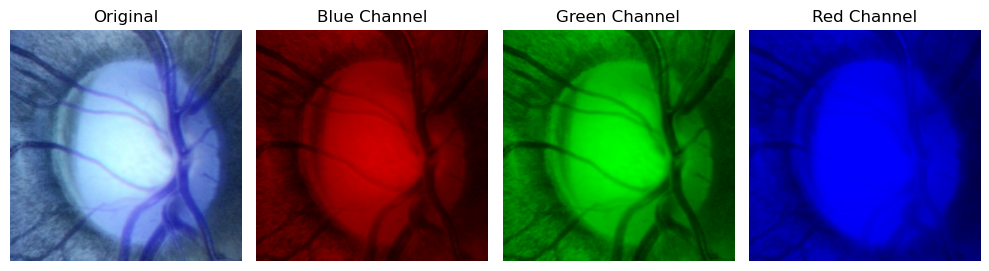

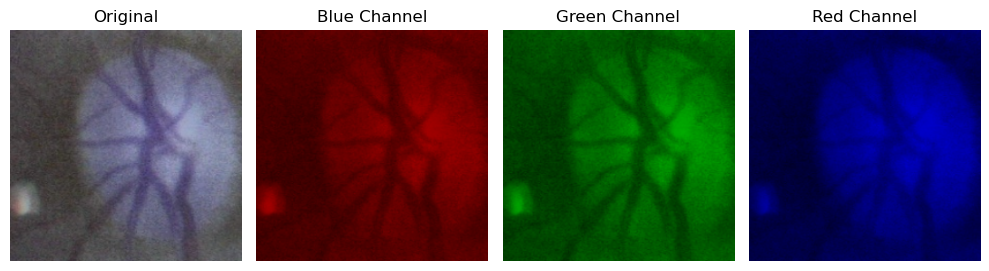

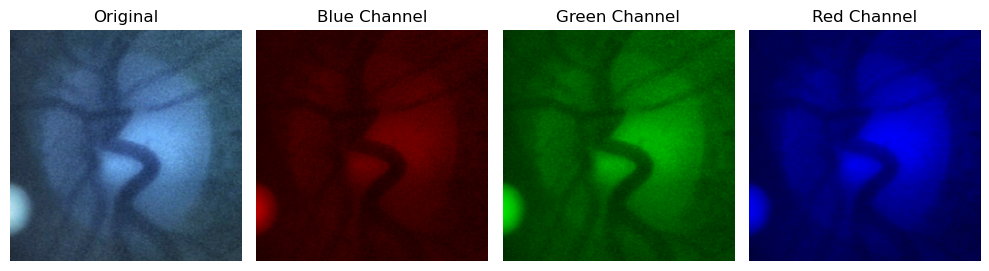

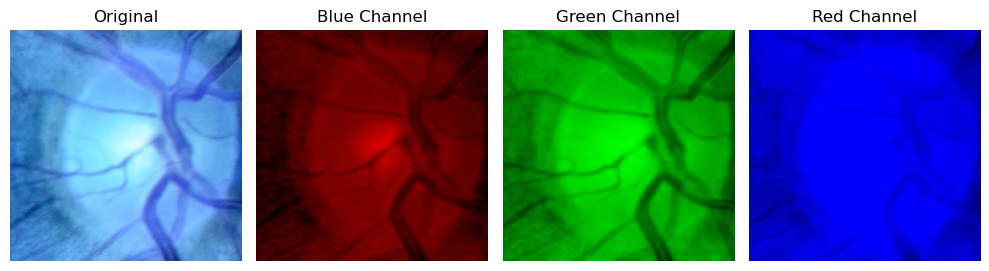

...

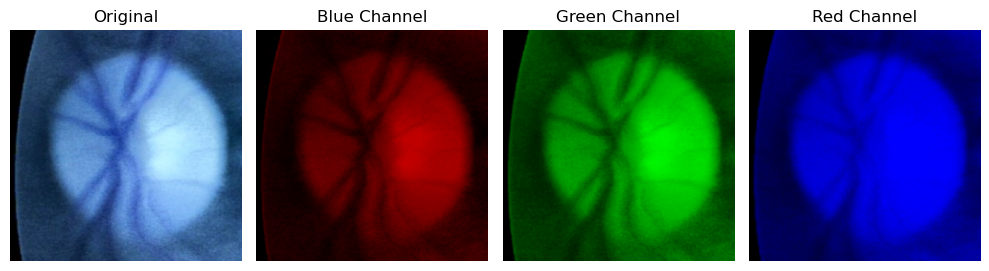

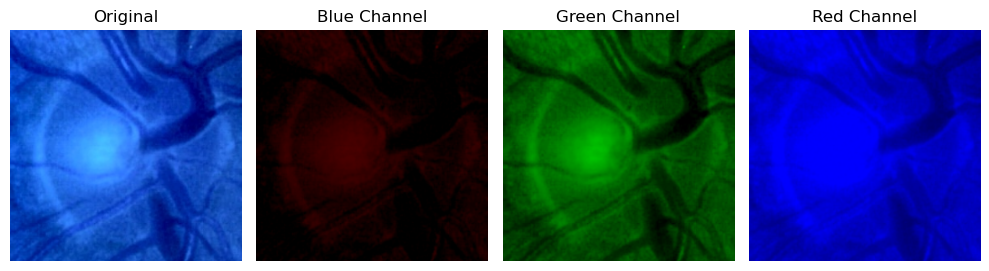

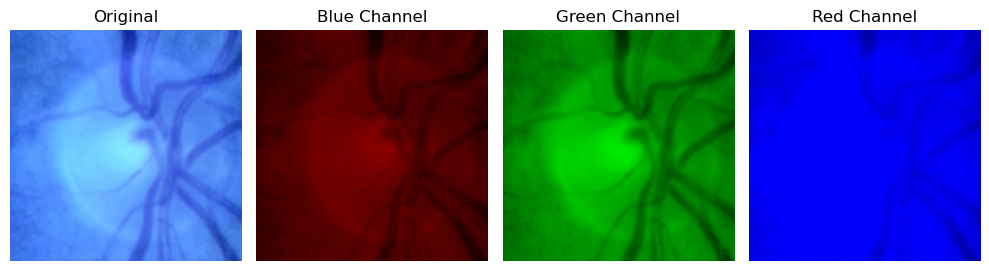

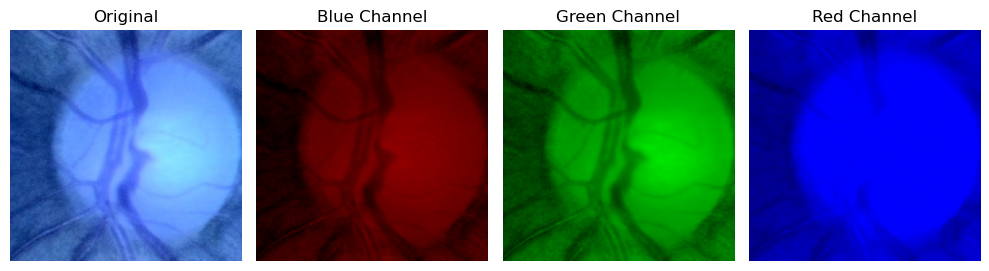

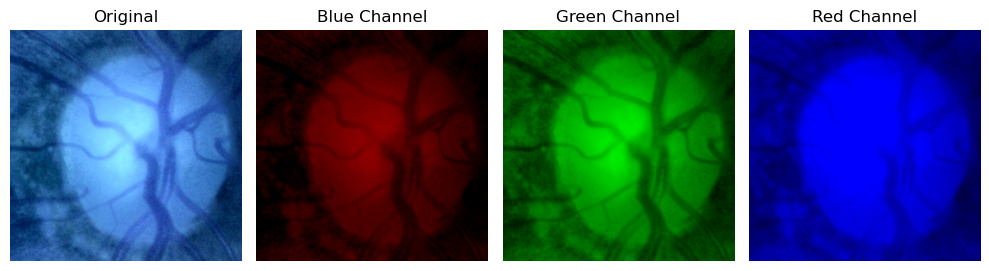

In [12]:
# Convert the images to grayscale and visualize each channel
for idx, resized_image in enumerate(resized_images):
    # Split the image into its RGB channels
    blue_channel, green_channel, red_channel = cv2.split(resized_image)
    
    # Create zeros arrays for other channels
    zeros = np.zeros_like(red_channel)
    
    # Create individual images for each channel
    blue_image = cv2.merge([blue_channel, zeros, zeros])
    green_image = cv2.merge([zeros, green_channel, zeros])
    red_image = cv2.merge([zeros, zeros, red_channel])
    
    # Display the images
    plt.figure(figsize=(10, 10))
    plt.subplot(1, 4, 1)
    plt.imshow(resized_image)
    plt.title('Original')
    plt.axis('off')
    
    plt.subplot(1, 4, 2)
    plt.imshow(blue_image)
    plt.title('Blue Channel')
    plt.axis('off')
    
    plt.subplot(1, 4, 3)
    plt.imshow(green_image)
    plt.title('Green Channel')
    plt.axis('off')
    
    plt.subplot(1, 4, 4)
    plt.imshow(red_image)
    plt.title('Red Channel')
    plt.axis('off')
    
    plt.tight_layout()
    plt.show()

In [13]:
def detect_optic_disc_and_cup(image):
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Apply CLAHE to enhance contrast
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    clahe_img = clahe.apply(gray)

    # Gaussian blur to reduce noise
    blurred = cv2.GaussianBlur(clahe_img, (7, 7), 0)

    # Binary thresholding to get the brightest regions that will include the optic disc
    _, disc_thresh = cv2.threshold(blurred, 70, 255, cv2.THRESH_BINARY)

    # Morphological closing to fill gaps in the optic disc
    kernel = np.ones((5, 5), np.uint8)
    closing = cv2.morphologyEx(disc_thresh, cv2.MORPH_CLOSE, kernel)

    # Find contours and select the largest one, assuming it's the optic disc
    contours, _ = cv2.findContours(closing, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    optic_disc_contour = max(contours, key=cv2.contourArea)
    disc_mask = np.zeros(gray.shape, np.uint8)
    cv2.drawContours(disc_mask, [optic_disc_contour], -1, (255), thickness=cv2.FILLED)

    # Create a mask for the optic cup by applying threshold to the optic disc area
    optic_disc_only = cv2.bitwise_and(clahe_img, clahe_img, mask=disc_mask)
    _, cup_thresh = cv2.threshold(optic_disc_only, 150, 255, cv2.THRESH_BINARY)  # Increase threshold if needed

    # Morphological opening to remove noise in the optic cup mask
    opening = cv2.morphologyEx(cup_thresh, cv2.MORPH_OPEN, kernel)

    return opening

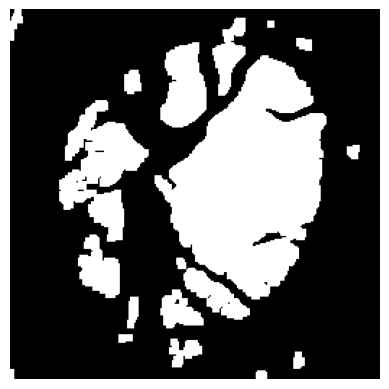

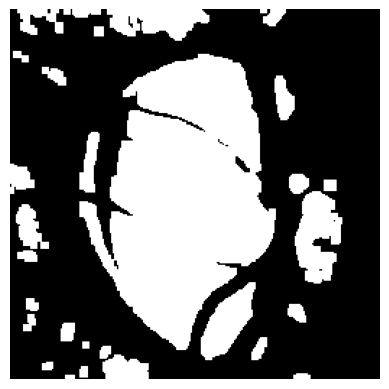

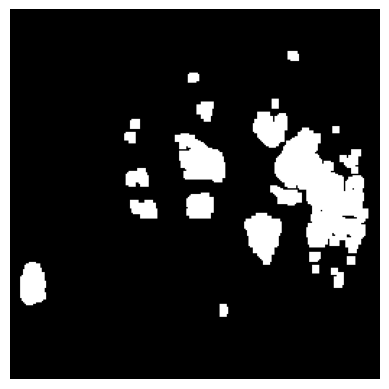

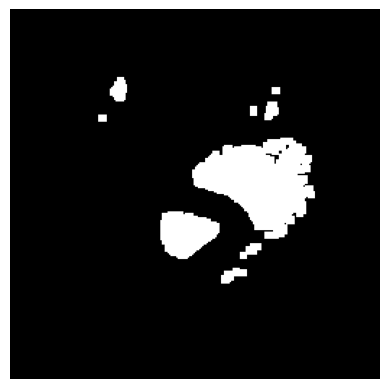

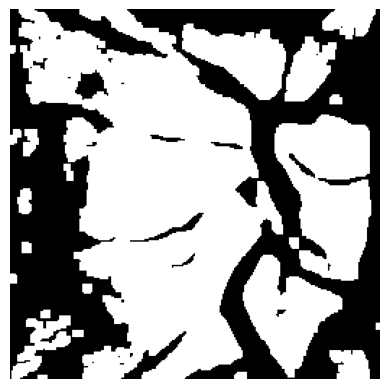

...

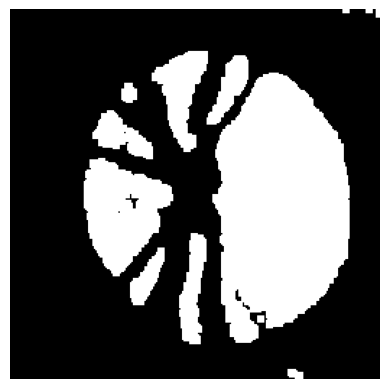

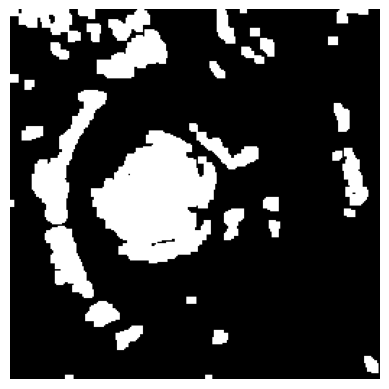

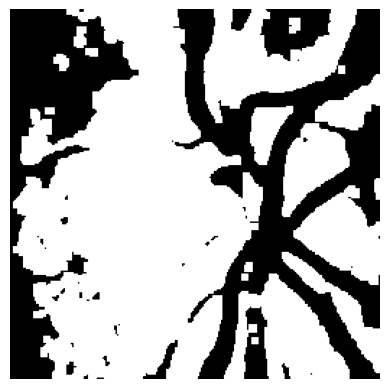

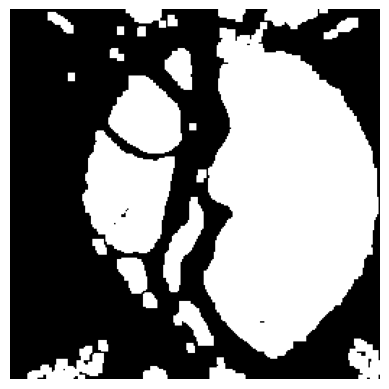

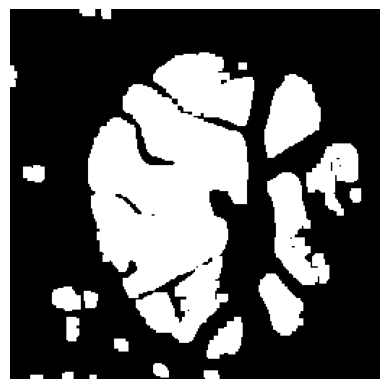

In [19]:
for all_images in resized_images:
    processed_mask = detect_optic_disc_and_cup(all_images)
    
    plt.imshow(processed_mask, cmap='gray')
    plt.axis('off')
    plt.show()

In [14]:
# Function for annotating circles
def annotate_circles(image):
    clone = image.copy()
    optic_disk = []
    optic_cup = []

    def draw_circle(event, x, y, flags, param):
        nonlocal optic_disk, optic_cup
        if event == cv2.EVENT_LBUTTONDOWN:
            cv2.circle(clone, (x, y), 5, (0, 0, 255), -1)
            optic_disk.append((x, y))
        elif event == cv2.EVENT_RBUTTONDOWN:
            cv2.circle(clone, (x, y), 5, (0, 255, 0), -1)
            optic_cup.append((x, y))

    #cv2.namedWindow("image")
    #cv2.setMouseCallback("image", draw_circle)

    #while True:
        #cv2.imshow("image", clone)
        #key = cv2.waitKey(1) & 0xFF
        #if key == ord("q"):
            #break

    #cv2.destroyAllWindows()

    return optic_disk, optic_cup

# Annotate circles for all images
optic_disks = []
optic_cups = []
for image in resized_images:
    optic_disk, optic_cup = annotate_circles(image)
    optic_disks.append(optic_disk)
    optic_cups.append(optic_cup)

# Print the annotated circles for all images
for i in range(len(optic_disks)):
    print(f"Image {i+1}:")
    print("Optic Disk:", optic_disks[i])
    print("Optic Cup:", optic_cups[i])
    print()

Image 1:
Optic Disk: []
Optic Cup: []

Image 2:
Optic Disk: []
Optic Cup: []

Image 3:
Optic Disk: []
Optic Cup: []

Image 4:
Optic Disk: []
Optic Cup: []

Image 5:
Optic Disk: []
Optic Cup: []

Image 6:
Optic Disk: []
Optic Cup: []

Image 7:
Optic Disk: []
Optic Cup: []

Image 8:
Optic Disk: []
Optic Cup: []

Image 9:
Optic Disk: []
Optic Cup: []

Image 10:
Optic Disk: []
Optic Cup: []

Image 11:
Optic Disk: []
Optic Cup: []

Image 12:
Optic Disk: []
Optic Cup: []

Image 13:
Optic Disk: []
Optic Cup: []

Image 14:
Optic Disk: []
Optic Cup: []

Image 15:
Optic Disk: []
Optic Cup: []

Image 16:
Optic Disk: []
Optic Cup: []

Image 17:
Optic Disk: []
Optic Cup: []

Image 18:
Optic Disk: []
Optic Cup: []

Image 19:
Optic Disk: []
Optic Cup: []

Image 20:
Optic Disk: []
Optic Cup: []

Image 21:
Optic Disk: []
Optic Cup: []

Image 22:
Optic Disk: []
Optic Cup: []

Image 23:
Optic Disk: []
Optic Cup: []

Image 24:
Optic Disk: []
Optic Cup: []

Image 25:
Optic Disk: []
Optic Cup: []

Image 26:

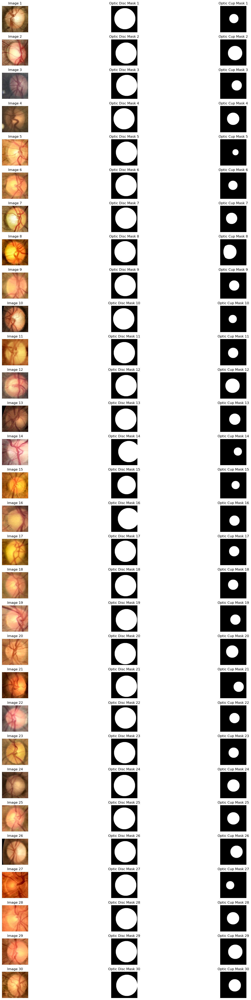

In [15]:
#Calculate Radius of optic cup and optic disc for ground truth masks
def create_disc_mask(image_shape, disc_center, disc_radius):
    mask = np.zeros(image_shape[:2], dtype=np.uint8)
    cv2.circle(mask, disc_center, disc_radius, 255, -1)
    return mask

def create_cup_mask(disc_mask, cup_center, cup_radius):
    mask = np.zeros_like(disc_mask)
    cv2.circle(mask, cup_center, cup_radius, 255, -1)
    mask = cv2.bitwise_and(mask, disc_mask)
    return mask

# Example usage
image_shape = (256, 256)
disk_centers = [(133, 123), (145, 134), (151, 125), (125,124),(149,126), (145,126), (143,120), (135,123), (136, 128), (122,127),
               (128,132),(145,129),(142,132),(172,123),(150,125), (168,127), (138,120), (140,131), (148,139), (137,145),
               (148,139), (139,122), (131,136),(129,132),(128,128),(136,129), (141,130),(148,131),(148,128),(152,132)]  # Example centers
cup_centers = [(133, 122), (145, 134), (161, 125), (126,124),(149,126), (124,124), (111,122), (89,124),(136,128), (122,128),
              (126,134),(120,130),(142,132),(172,123), (150,125), (139,146), (136, 120), (126, 122), (148, 138), (117,125),
              (180,144),(139,123),(131,136),(129,132),(128,128), (159,129), (97,131),(125,127),(147,129),(142,132)]  # Example centers
disk_radii = [103, 103, 103, 103,104, 104, 104, 104, 104,104,104,104,104,104, 90, 104, 104, 104, 104,104, 104, 104, 104, 104, 106,104,104,104,104,104]  # Example radii
cup_radii = [45, 70, 50 ,60, 30, 45, 55, 70, 50,40,50,70,55,40, 40, 50, 50, 50, 50,60, 50, 50, 50, 60, 60,60,40,60,70,60]  # Example radii

# Create disc mask
disc_masks = [create_disc_mask(image_shape, center, radius) for center, radius in zip(disk_centers, disk_radii)]

# Create cup mask
cup_masks = [create_cup_mask(disc_mask, center, radius) for disc_mask, center, radius in zip(disc_masks, cup_centers, cup_radii)]

# Threshold the masks to binary
disc_masks_binary = [cv2.threshold(mask, 127, 255, cv2.THRESH_BINARY)[1] for mask in disc_masks]
cup_masks_binary = [cv2.threshold(mask, 127, 255, cv2.THRESH_BINARY)[1] for mask in cup_masks]


# Optic disc class is 1, background is 0
optic_disc_class = 1
# Optic cup class is 1, background is 0
optic_cup_class = 1

# Adjust ground truth masks
#disc_masks_binary_adjusted = [(mask == 255).astype(int) for mask in disc_masks_binary]
#cup_masks_binary_adjusted = [(mask == 255).astype(int) for mask in cup_masks_binary]
# Adjust ground truth masks
disc_masks_binary_adjusted = [(mask == 255).astype(int) * optic_disc_class for mask in disc_masks_binary]
cup_masks_binary_adjusted = [(mask == 255).astype(int) * optic_cup_class for mask in cup_masks_binary]

# Display images and masks
plt.figure(figsize=(20, 50))
for i in range(len(disc_masks_binary_adjusted)):
    # Load the original image
    image = resized_images[i]
    
    # Plot the original image and masks
    plt.subplot(30, 3, i*3 + 1)
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.title(f'Image {i+1}')
    plt.axis('off')
    
    plt.subplot(30, 3, i*3 + 2)
    plt.imshow(disc_masks_binary_adjusted[i], cmap='gray')
    plt.title(f'Optic Disc Mask {i+1}')
    plt.axis('off')
    
    plt.subplot(30, 3, i*3 + 3)
    plt.imshow(cup_masks_binary_adjusted[i], cmap='gray')
    plt.title(f'Optic Cup Mask {i+1}')
    plt.axis('off')

plt.tight_layout()
plt.show()

In [ ]:
#Segmentation of Optic Disk 
# Define U-Net model
def gnet_disc(input_shape, num_classes):
    inputs = Input(input_shape)

    # Encoder
    conv1 = Conv2D(32, 3, activation='relu', padding='same', kernel_initializer='he_normal')(inputs)
    conv1 = Conv2D(32, 3, activation='relu', padding='same', kernel_initializer='he_normal')(conv1)
    
    pool1 = MaxPooling2D(pool_size=(2, 2))(conv1)
    conv2 = Conv2D(64, 3, activation='relu', padding='same', kernel_initializer='he_normal')(pool1)
    conv2 = Conv2D(64, 3, activation='relu', padding='same', kernel_initializer='he_normal')(conv2)
    
    pool2 = MaxPooling2D(pool_size=(2, 2))(conv2)
    conv3 = Conv2D(64, 3, activation='relu', padding='same', kernel_initializer='he_normal')(pool2)
    conv3 = Conv2D(128, 3, activation='relu', padding='same', kernel_initializer='he_normal')(conv3)
    
    pool3 = MaxPooling2D(pool_size=(2, 2))(conv3)
    conv4 = Conv2D(64, 3, activation='relu', padding='same', kernel_initializer='he_normal')(pool3)
    conv4 = Conv2D(64, 3, activation='relu', padding='same', kernel_initializer='he_normal')(conv4)
    
    pool4 = MaxPooling2D(pool_size=(2, 2))(conv4)
    conv5 = Conv2D(64, 3, activation='relu', padding='same', kernel_initializer='he_normal')(pool4)
    conv5 = Conv2D(64, 3, activation='relu', padding='same', kernel_initializer='he_normal')(conv5)
    up6 = UpSampling2D(size=(2, 2))(conv5)
    
    merge6 = concatenate([conv4, up6], axis=3)
    conv6 = Conv2D(64, 3, activation='relu', padding='same', kernel_initializer='he_normal')(merge6)
    conv6 = Conv2D(64, 3, activation='relu', padding='same', kernel_initializer='he_normal')(conv6)
    up7 = UpSampling2D(size=(2, 2))(conv6)
    
    merge7 = concatenate([conv3, up7], axis=3)
    conv7 = Conv2D(64, 3, activation='relu', padding='same', kernel_initializer='he_normal')(merge7)
    conv7 = Conv2D(64, 3, activation='relu', padding='same', kernel_initializer='he_normal')(conv7)
    up8 = UpSampling2D(size=(2, 2))(conv7)
   
    merge8 = concatenate([conv2, up8], axis=3)
    conv8 = Conv2D(64, 3, activation='relu', padding='same', kernel_initializer='he_normal')(merge8)
    conv8 = Conv2D(64, 3, activation='relu', padding='same', kernel_initializer='he_normal')(conv8)
    up9 = UpSampling2D(size=(2, 2))(conv8)
    
    merge9 = concatenate([conv1, up9], axis=3)
    conv9 = Conv2D(32, 3, activation='relu', padding='same', kernel_initializer='he_normal')(merge9)
    conv9 = Conv2D(32, 3, activation='relu', padding='same', kernel_initializer='he_normal')(conv9)
    
    conv10 = Conv2D(num_classes, 1, activation='sigmoid')(conv9)

    model = tf.keras.Model(inputs=inputs, outputs=conv10)

    return model

# Example usage
input_shape = (256, 256, 3)
num_classes = 1
model = gnet_disc(input_shape, num_classes)
#model.summary()

# Split the data into training and validation sets
# Convert the lists to numpy arrays
X = np.array(resized_images)
y = np.array(disc_masks_binary_adjusted)

# Split the data into training and validation sets
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)
X_train = X_train / 255.0
X_val = X_val / 255.0

# Convert y_train and y_val to float and expand the dimensions
y_train = np.expand_dims(y_train, axis=-1)
y_val = np.expand_dims(y_val, axis=-1)

#y_train = np.squeeze(y_train, axis= 5)
#y_val = np.squeeze(y_val, axis= 5)

# Check for NaN values
#def check_nan_inf(data, name):
   # nan_count = np.isnan(data).sum()
    #inf_count = np.isinf(data).sum()
    #print(f"{name}: NaN count = {nan_count}, inf count = {inf_count}")

# Check X_train
#check_nan_inf(X_train, "X_train")
# Check y_train
#check_nan_inf(y_train, "y_train")
# Check X_val
#check_nan_inf(X_val, "X_val")
# Check y_val
#check_nan_inf(y_val, "y_val")

# Compile the model with Adam optimizer and reduced learning rate
opt = optimizers.Adam(clipvalue=0.5)
model.compile(optimizer=opt, loss='binary_crossentropy', metrics=['accuracy'])


# Add a learning rate scheduler
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=5, min_lr=1e-6)


# Data augmentation
data_gen_args = dict(rotation_range=10,
                     width_shift_range=0.1,
                     height_shift_range=0.1,
                     shear_range=0.1,
                     zoom_range=0.1,
                     horizontal_flip=True,
                     vertical_flip=True,
                     fill_mode='reflect')

image_datagen = ImageDataGenerator(**data_gen_args)
mask_datagen = ImageDataGenerator(**data_gen_args)

# Provide the same seed and keyword arguments to the fit and flow methods
seed = 1
image_datagen.fit(X_train, augment=True, seed=seed)
mask_datagen.fit(y_train, augment=True, seed=seed)

# Train generator
image_generator = image_datagen.flow(X_train, batch_size=2, seed=seed)
mask_generator = mask_datagen.flow(y_train, batch_size=2, seed=seed)

# Combine generators into one which yields image and masks
train_generator = zip(image_generator, mask_generator)




In [ ]:
# Define a function to calculate sensitivity and specificity
def calculate_metrics(y_true, y_pred):
    # Assuming y_true and y_pred are numpy arrays
    tp = np.sum((y_true == 1) & (y_pred == 1))
    tn = np.sum((y_true == 0) & (y_pred == 0))
    fp = np.sum((y_true == 0) & (y_pred == 1))
    fn = np.sum((y_true == 1) & (y_pred == 0))
    
    sensitivity  = tp / (tp + fn + K.epsilon())
    specificity = tn / (tn + fp + K.epsilon())
    
    return sensitivity, specificity

# Compute the total number of augmented images per epoch
total_samples = len(X_train)  # Number of original images
augmentation_factor = 15  # Number of augmented images generated per original image
images_per_epoch = total_samples * augmentation_factor

# Compute steps_per_epoch based on batch_size
batch_size = 16
steps_per_epoch = images_per_epoch // batch_size

# Train the model
history = model.fit(train_generator, validation_data=(X_val, y_val), 
                    steps_per_epoch=steps_per_epoch, epochs=5, verbose=1)

# Calculate sensitivity and specificity for each epoch
sensitivity = []
specificity = []

for i in range(len(history.history['val_loss'])):
    y_pred = model.predict(X_val)
    sens, spec = calculate_metrics(y_val, np.round(y_pred))  # Assuming y_pred needs to be rounded to 0 or 1
    sensitivity.append(sens)
    specificity.append(spec)
    print(f"Epoch {i+1}: Sensitivity = {sens}, Specificity = {spec}")

# Plot training history
import matplotlib.pyplot as plt

plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()


In [ ]:
#Segmentation of Optic Cup 

def gnet_cup(input_shape, num_classes):
    inputs = Input(input_shape)

    # Encoder
    conv1 = Conv2D(34,(4,2), activation='relu', padding='same', kernel_initializer='he_normal')(inputs)
    conv1 = Conv2D(34,(4,2), activation='relu', padding='same', kernel_initializer='he_normal')(conv1)
    
    pool1 = MaxPooling2D(pool_size=(4, 4))(conv1)
    conv2 = Conv2D(64, 4, activation='relu', padding='same', kernel_initializer='he_normal')(pool1)
    conv2 = Conv2D(64, 4, activation='relu', padding='same', kernel_initializer='he_normal')(conv2)
    
    pool2 = MaxPooling2D(pool_size=(4, 4))(conv2)
    conv3 = Conv2D(64, 4, activation='relu', padding='same', kernel_initializer='he_normal')(pool2)
    conv3 = Conv2D(64, 4, activation='relu', padding='same', kernel_initializer='he_normal')(conv3)
    
    pool3 = MaxPooling2D(pool_size=(4, 4))(conv3)
    conv4 = Conv2D(64, 4, activation='relu', padding='same', kernel_initializer='he_normal')(pool3)
    conv4 = Conv2D(64, 4, activation='relu', padding='same', kernel_initializer='he_normal')(conv4)
    
    pool4 = MaxPooling2D(pool_size=(4, 4))(conv4)
    conv5 = Conv2D(64, 4, activation='relu', padding='same', kernel_initializer='he_normal')(pool4)
    conv5 = Conv2D(64, 4, activation='relu', padding='same', kernel_initializer='he_normal')(conv5)
    up6 = UpSampling2D(size=(4, 4))(conv5)
    
    merge6 = concatenate([conv4, up6], axis=3)
    conv6 = Conv2D(64, 4, activation='relu', padding='same', kernel_initializer='he_normal')(merge6)
    conv6 = Conv2D(64, 4, activation='relu', padding='same', kernel_initializer='he_normal')(conv6)
    up7 = UpSampling2D(size=(4, 4))(conv6)
    
    merge7 = concatenate([conv3, up7], axis=3)
    conv7 = Conv2D(64, 4, activation='relu', padding='same', kernel_initializer='he_normal')(merge7)
    conv7 = Conv2D(64, 4, activation='relu', padding='same', kernel_initializer='he_normal')(conv7)
    up8 = UpSampling2D(size=(4, 4))(conv7)
   
    merge8 = concatenate([conv2, up8], axis=3)
    conv8 = Conv2D(64, 4, activation='relu', padding='same', kernel_initializer='he_normal')(merge8)
    conv8 = Conv2D(64, 4, activation='relu', padding='same', kernel_initializer='he_normal')(conv8)
    up9 = UpSampling2D(size=(4, 4))(conv8)
    
    merge9 = concatenate([conv1, up9], axis=3)
    conv9 = Conv2D(34, (4,2), activation='relu', padding='same', kernel_initializer='he_normal')(merge9)
    conv9 = Conv2D(34, (4,2), activation='relu', padding='same', kernel_initializer='he_normal')(conv9)
    
    conv10 = Conv2D(num_classes, 1, activation='softmax')(conv9)

    model = tf.keras.Model(inputs=inputs, outputs=conv10)

    return model

# Example usage
input_shape = (256, 256, 3)
num_classes = 1
model = gnet_cup(input_shape, num_classes)
#model.summary()

# Split the data into training and validation sets
# Convert the lists to numpy arrays
X = np.array(preprocessed_resized_images_rgb)
y = np.array(cup_masks_binary_adjusted)



# Split the data into training and validation sets
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)
X_train = X_train / 255.0
X_val = X_val / 255.0

# Reshape X_train and X_val to include channel dimension
#X_train = np.expand_dims(X_train, axis=-1)
#X_val = np.expand_dims(X_val, axis=-1)

# Reshape y_train and y_val to include channel dimension
y_train = np.expand_dims(y_train, axis=-1)
y_val = np.expand_dims(y_val, axis=-1)

# Compile the model with Adam optimizer and reduced learning rate
opt = optimizers.Adam(clipvalue=0.5)
model.compile(optimizer=opt, loss='binary_crossentropy', metrics=['accuracy'])


# Add a learning rate scheduler
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=5, min_lr=1e-6)


# Data augmentation
data_gen_args = dict(rotation_range=10,
                     width_shift_range=0.1,
                     height_shift_range=0.1,
                     shear_range=0.1,
                     zoom_range=0.1,
                     horizontal_flip=True,
                     vertical_flip=True,
                     fill_mode='reflect')

image_datagen = ImageDataGenerator(**data_gen_args)
mask_datagen = ImageDataGenerator(**data_gen_args)

# Provide the same seed and keyword arguments to the fit and flow methods
seed = 1
image_datagen.fit(X_train, augment=True, seed=seed)
mask_datagen.fit(y_train, augment=True, seed=seed)

# Train generator
image_generator = image_datagen.flow(X_train, batch_size=2, seed=seed)
mask_generator = mask_datagen.flow(y_train, batch_size=2, seed=seed)

# Combine generators into one which yields image and masks
train_generator = zip(image_generator, mask_generator)

# Compute the total number of augmented images per epoch
total_samples = len(X_train)  # Number of original images
augmentation_factor = 15  # Number of augmented images generated per original image CHANGE THIS 
images_per_epoch = total_samples * augmentation_factor

# Compute steps_per_epoch
batch_size = 5 #CHANGE THIS 
steps_per_epoch = len(X_train) // batch_size


# Train the model
#history = model.fit(train_generator, validation_data=(X_val, y_val), epochs=10, verbose=1)
# Train the model
history = model.fit(train_generator, validation_data=(X_val, y_val), 
                    steps_per_epoch=images_per_epoch // batch_size, epochs=2, verbose=1)

# Calculate sensitivity and specificity for each epoch
sensitivity = []
specificity = []

for i in range(len(history.history['val_loss'])):
    y_pred = model.predict(X_val)
    sens, spec = calculate_metrics(y_val, y_pred)
    sensitivity.append(sens)
    specificity.append(spec)
    print(f"Epoch {i+1}: Sensitivity = {sens}, Specificity = {spec}")


#print("Last batch prediction shape:", y_pred.shape)
#print("Last batch prediction values:", y_pred)
#print("Last batch true labels shape:", y_batch.shape)
#print("Last batch true labels values:", y_batch)


# Plot training history
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()